<a href="https://colab.research.google.com/github/sunilhucharaddi/fastai-v3/blob/master/lesson4_collab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!curl -s https://course.fast.ai/setup/colab | bash

Updating fastai...
Done.


In [2]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = "/content/gdrive/My Drive/"
base_dir = root_dir + 'fastai-v3/'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [0]:
from fastai.collab import *
from fastai.tabular import *

**Collaborative filtering example**

`collab` models use datain `DataFrame` of user,items, and ratings.

In [0]:
user,item,title = 'userId', 'movieId', 'title'

In [7]:
path = untar_data(URLs.ML_SAMPLE)
path

PosixPath('/root/.fastai/data/movie_lens_sample')

In [8]:
ratings = pd.read_csv(path/'ratings.csv')
ratings.head()

,userId,movieId,rating,timestamp
0,73,1097,4.0,1255504951
1,561,924,3.5,1172695223
2,157,260,3.5,1291598691
3,358,1210,5.0,957481884
4,130,316,2.0,1138999234


In [0]:
data = CollabDataBunch.from_df(ratings, seed=42)

In [0]:
y_range = [0, 5.5]

In [0]:
learn = collab_learner(data, n_factors=50, y_range=y_range)

In [12]:
learn.lr_find()

epoch,train_loss,valid_loss,time
0,1.826657,#na#,00:00


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


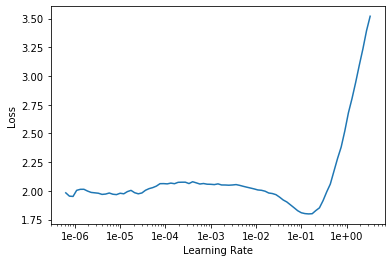

In [13]:
learn.recorder.plot()

In [14]:
learn.fit_one_cycle(3,5e-3)

epoch,train_loss,valid_loss,time
0,1.629658,0.958995,00:00
1,0.854624,0.676899,00:00
2,0.654930,0.672777,00:00


Movielens 100k dataset[link text](http://files.grouplens.org/datasets/movielens/ml-100k.zip)

In [20]:
from google.colab import files
files.upload()

Saving ml-100k.zip to ml-100k.zip


{'ml-100k.zip': b'PK\x03\x04\n\x00\x00\x00\x00\x00Ns=H\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x1c\x00ml-100k/UT\t\x00\x03\xf3\xca\xabVF\xcb\xabVux\x0b\x00\x01\x04\xf6\x01\x00\x00\x04\x14\x00\x00\x00PK\x03\x04\x14\x00\x02\x00\x08\x00.\x81\xf3(\xdb\xde\xf0Li\x01\x00\x00\xcc\x02\x00\x00\x11\x00\x1c\x00ml-100k/allbut.plUT\t\x00\x03\x07\x19v9\x05\xcb\xabVux\x0b\x00\x01\x04\xf6\x01\x00\x00\x04\x14\x00\x00\x00\x85R]O\xc20\x14}^\x7f\xc5e,d\x0bf\xd3\xf8&\x83\x88:\x8d\x89O\x80\xbe\xa8!\x05\xba\xd1dtK[\x84\x04\xf6\xdf\xed\xc7\x18\x9a\x99\xf8\xd2\xdc\xf6\xdcs\xee\xb9\xf7\xb6\xdb\x89\xb6\x82Gy\xb1\xc4y\xb4\xa0,*\t\xcf\x11\xeaBF$`\x9e\tDS\xf0o\xc7\x93\xa77\x88\xe1:\x80\x03rJN\x99\x84\xe9\xec!\x99L\xc0}\x158#7\xe0]\xc2\x02\x0b2gxC@H\xcc\xa5:\x8b\x126x?\x97DHx\xe7XR\x96\t\x08\xc3\xf0\xf3\x83\xb9\x03\xe4\x90=\x95p5@\x15\xf24\xd7P\x87 \xd64\x95\x03\xe4Y\x91\x9fw%w\xbe*a\xa3\xdb\xbc(\xd3EI\x18\xa44\'\x02\xe9\xd0\x87Y2\x9d=>\xbf$\x17\xe0\x8e\x9a\x1a\xa1\xe6\xb9\x10@\xc1aE\t\xb8\xf7\x98\xb

In [22]:
!unzip ml-100k.zip

Archive:  ml-100k.zip
   creating: ml-100k/
  inflating: ml-100k/allbut.pl       
  inflating: ml-100k/mku.sh          
  inflating: ml-100k/README          
  inflating: ml-100k/u.data          
  inflating: ml-100k/u.genre         
  inflating: ml-100k/u.info          
  inflating: ml-100k/u.item          
  inflating: ml-100k/u.occupation    
  inflating: ml-100k/u.user          
  inflating: ml-100k/u1.base         
  inflating: ml-100k/u1.test         
  inflating: ml-100k/u2.base         
  inflating: ml-100k/u2.test         
  inflating: ml-100k/u3.base         
  inflating: ml-100k/u3.test         
  inflating: ml-100k/u4.base         
  inflating: ml-100k/u4.test         
  inflating: ml-100k/u5.base         
  inflating: ml-100k/u5.test         
  inflating: ml-100k/ua.base         
  inflating: ml-100k/ua.test         
  inflating: ml-100k/ub.base         
  inflating: ml-100k/ub.test         


In [0]:
path = Config.data_path()/'ml-100k'

In [25]:
ratings = pd.read_csv(path/'u.data', delimiter = '\t', header=None,
                        names=[user,item,'rating','timestamp'])
ratings.head()

,userId,movieId,rating,timestamp
0,196,242,3,881250949
1,186,302,3,891717742
2,22,377,1,878887116
3,244,51,2,880606923
4,166,346,1,886397596


In [0]:
movies = pd.read_csv(path/'u.item', delimiter='|', encoding='latin-1', header=None,
                     names=[item, 'title', 'date', 'N', 'url', *[f'g{i}' for i in range(19)]])

In [28]:
movies.head()

,movieId,title,date,N,url,g0,g1,g2,g3,g4,g5,g6,g7,g8,g9,g10,g11,g12,g13,g14,g15,g16,g17,g18
0,1,Toy Story (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Toy%20Story%2...,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2,GoldenEye (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?GoldenEye%20(...,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,3,Four Rooms (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Four%20Rooms%...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,4,Get Shorty (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Get%20Shorty%...,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
4,5,Copycat (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Copycat%20(1995),0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0


In [29]:
len(ratings)

100000

In [31]:
rating_movie = ratings.merge(movies[[item, title]])
rating_movie.head()

,userId,movieId,rating,timestamp,title
0,196,242,3,881250949,Kolya (1996)
1,63,242,3,875747190,Kolya (1996)
2,226,242,5,883888671,Kolya (1996)
3,154,242,3,879138235,Kolya (1996)
4,306,242,5,876503793,Kolya (1996)


In [0]:
data = CollabDataBunch.from_df(rating_movie, seed=42, valid_pct=0.1, item_name=title)

In [33]:
data.show_batch()

userId,title,target
324,Evita (1996),5.0
943,Nine Months (1995),3.0
13,My Left Foot (1989),5.0
528,Much Ado About Nothing (1993),5.0
542,Dumbo (1941),4.0


In [0]:
y_range = [0,5.5]

In [0]:
learn = collab_learner(data,n_factors=40,y_range=y_range,wd=1e-1)

epoch,train_loss,valid_loss,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


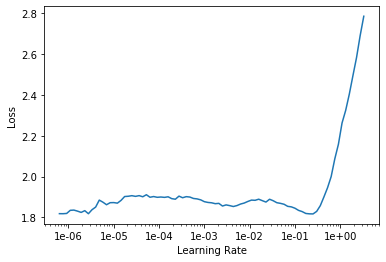

In [37]:
learn.lr_find()
learn.recorder.plot()

In [38]:
learn.fit_one_cycle(5,5e-3)

epoch,train_loss,valid_loss,time
0,0.917358,0.949092,00:11
1,0.834980,0.884256,00:11
2,0.756666,0.838175,00:11
3,0.632519,0.818852,00:11
4,0.557454,0.817119,00:11


In [0]:
learn.save('dotprod')

**Interpretation**

**`SETUP`**

In [40]:
learn.load('dotprod')

CollabLearner(data=TabularDataBunch;

Train: LabelList (90000 items)
x: CollabList
userId 196; title Kolya (1996); ,userId 63; title Kolya (1996); ,userId 226; title Kolya (1996); ,userId 154; title Kolya (1996); ,userId 306; title Kolya (1996); 
y: FloatList
3.0,3.0,5.0,3.0,5.0
Path: .;

Valid: LabelList (10000 items)
x: CollabList
userId 498; title Casino (1995); ,userId 642; title Pocahontas (1995); ,userId 58; title 2001: A Space Odyssey (1968); ,userId 495; title Cat People (1982); ,userId 618; title Philadelphia (1993); 
y: FloatList
3.0,5.0,4.0,3.0,3.0
Path: .;

Test: None, model=EmbeddingDotBias(
  (u_weight): Embedding(944, 40)
  (i_weight): Embedding(1654, 40)
  (u_bias): Embedding(944, 1)
  (i_bias): Embedding(1654, 1)
), opt_func=functools.partial(<class 'torch.optim.adam.Adam'>, betas=(0.9, 0.99)), loss_func=FlattenedLoss of MSELoss(), metrics=[], true_wd=True, bn_wd=True, wd=0.1, train_bn=True, path=PosixPath('.'), model_dir='models', callback_fns=[functools.partial(<clas

In [41]:
learn.model

EmbeddingDotBias(
  (u_weight): Embedding(944, 40)
  (i_weight): Embedding(1654, 40)
  (u_bias): Embedding(944, 1)
  (i_bias): Embedding(1654, 1)
)

In [43]:
g = rating_movie.groupby (title)['rating'].count()
top_movies = g.sort_values(ascending=False).index.values[:1000]
top_movies[:10]

array(['Star Wars (1977)', 'Contact (1997)', 'Fargo (1996)', 'Return of the Jedi (1983)', 'Liar Liar (1997)',
       'English Patient, The (1996)', 'Scream (1996)', 'Toy Story (1995)', 'Air Force One (1997)',
       'Independence Day (ID4) (1996)'], dtype=object)

**`MOVIE BIAS`**

In [44]:
movie_bias = learn.bias(top_movies,is_item=True)
movie_bias.shape

torch.Size([1000])

In [0]:
mean_ratings = rating_movie.groupby(title)['rating'].mean()
movie_ratings = [(b,i,mean_ratings.loc[i]) for i,b in zip(top_movies,movie_bias)]

In [0]:
item0 = lambda o:o[0]

In [50]:
sorted(movie_ratings, key=item0)[:15]

[(tensor(-0.3719),
  'Children of the Corn: The Gathering (1996)',
  1.3157894736842106),
 (tensor(-0.3142), 'Mortal Kombat: Annihilation (1997)', 1.9534883720930232),
 (tensor(-0.3019), 'Cable Guy, The (1996)', 2.339622641509434),
 (tensor(-0.2923),
  'Lawnmower Man 2: Beyond Cyberspace (1996)',
  1.7142857142857142),
 (tensor(-0.2785), 'Striptease (1996)', 2.2388059701492535),
 (tensor(-0.2630), 'Island of Dr. Moreau, The (1996)', 2.1578947368421053),
 (tensor(-0.2612), 'Barb Wire (1996)', 1.9333333333333333),
 (tensor(-0.2333), 'Beautician and the Beast, The (1997)', 2.313953488372093),
 (tensor(-0.2257), 'Crow: City of Angels, The (1996)', 1.9487179487179487),
 (tensor(-0.2185), 'Bio-Dome (1996)', 1.903225806451613),
 (tensor(-0.2150), 'Grease 2 (1982)', 2.0),
 (tensor(-0.2108), 'Thinner (1996)', 2.4489795918367347),
 (tensor(-0.2022), 'Free Willy 3: The Rescue (1997)', 1.7407407407407407),
 (tensor(-0.2015), "Joe's Apartment (1996)", 2.2444444444444445),
 (tensor(-0.2001), 'Hellra

In [51]:
sorted(movie_ratings, key=lambda o: o[0], reverse=True)[:15]

[(tensor(0.6028), "Schindler's List (1993)", 4.466442953020135),
 (tensor(0.5632), 'Titanic (1997)', 4.2457142857142856),
 (tensor(0.5478), 'Silence of the Lambs, The (1991)', 4.28974358974359),
 (tensor(0.5409), 'Shawshank Redemption, The (1994)', 4.445229681978798),
 (tensor(0.5404), 'Rear Window (1954)', 4.3875598086124405),
 (tensor(0.5223), 'Star Wars (1977)', 4.3584905660377355),
 (tensor(0.5119), 'Good Will Hunting (1997)', 4.262626262626263),
 (tensor(0.5089), 'L.A. Confidential (1997)', 4.161616161616162),
 (tensor(0.5039), 'As Good As It Gets (1997)', 4.196428571428571),
 (tensor(0.4767), 'Usual Suspects, The (1995)', 4.385767790262173),
 (tensor(0.4760), "One Flew Over the Cuckoo's Nest (1975)", 4.291666666666667),
 (tensor(0.4743), 'Casablanca (1942)', 4.45679012345679),
 (tensor(0.4499), 'Vertigo (1958)', 4.251396648044692),
 (tensor(0.4488), 'Apt Pupil (1998)', 4.1),
 (tensor(0.4429), 'Wrong Trousers, The (1993)', 4.466101694915254)]

**`Movie weights`**

In [52]:
movie_w = learn.weight(top_movies, is_item=True)
movie_w.shape

torch.Size([1000, 40])

In [53]:
movie_pca = movie_w.pca(3)
movie_pca.shape

torch.Size([1000, 3])

In [0]:
fac0,fac1,fac2 = movie_pca.t()
movie_comp = [(f,i) for f,i in zip(fac0, top_movies)]

In [55]:
sorted(movie_comp, key=itemgetter(0), reverse=True)[:10]

[(tensor(1.2349), 'Home Alone 3 (1997)'),
 (tensor(1.2097), "McHale's Navy (1997)"),
 (tensor(1.1943), 'Jungle2Jungle (1997)'),
 (tensor(1.1020), 'D3: The Mighty Ducks (1996)'),
 (tensor(1.0993), 'Children of the Corn: The Gathering (1996)'),
 (tensor(1.0971), 'Bio-Dome (1996)'),
 (tensor(1.0785), 'Leave It to Beaver (1997)'),
 (tensor(1.0414), 'Free Willy 3: The Rescue (1997)'),
 (tensor(1.0271), 'Grease 2 (1982)'),
 (tensor(1.0180), 'Flipper (1996)')]

In [56]:
sorted(movie_comp, key=itemgetter(0))[:10]

[(tensor(-1.1555), 'Close Shave, A (1995)'),
 (tensor(-1.1496), 'Wrong Trousers, The (1993)'),
 (tensor(-1.1053), 'Chinatown (1974)'),
 (tensor(-1.0745), 'Lawrence of Arabia (1962)'),
 (tensor(-1.0601), 'Casablanca (1942)'),
 (tensor(-1.0282), 'When We Were Kings (1996)'),
 (tensor(-0.9960), 'Godfather, The (1972)'),
 (tensor(-0.9563), 'Some Folks Call It a Sling Blade (1993)'),
 (tensor(-0.9532), 'Wallace & Gromit: The Best of Aardman Animation (1996)'),
 (tensor(-0.9488),
  'Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1963)')]

In [0]:
movie_comp = [(f,i) for f,i in zip(fac1,top_movies)]

In [58]:
sorted(movie_comp, key=itemgetter(0),reverse=True)[:10]

[(tensor(1.2108), 'Braveheart (1995)'),
 (tensor(1.1260), 'Titanic (1997)'),
 (tensor(1.0492), 'Raiders of the Lost Ark (1981)'),
 (tensor(0.9119), 'Independence Day (ID4) (1996)'),
 (tensor(0.8932), 'American President, The (1995)'),
 (tensor(0.8922), "It's a Wonderful Life (1946)"),
 (tensor(0.8595), 'Forrest Gump (1994)'),
 (tensor(0.8335), 'Top Gun (1986)'),
 (tensor(0.8331), "Mr. Holland's Opus (1995)"),
 (tensor(0.8242), 'Pretty Woman (1990)')]

In [59]:
sorted(movie_comp, key=itemgetter(0))[:10]

[(tensor(-0.8802), 'Keys to Tulsa (1997)'),
 (tensor(-0.8420), 'Jude (1996)'),
 (tensor(-0.8412), 'Clockwork Orange, A (1971)'),
 (tensor(-0.8379), 'Ready to Wear (Pret-A-Porter) (1994)'),
 (tensor(-0.7991), 'Brazil (1985)'),
 (tensor(-0.7880), 'Serial Mom (1994)'),
 (tensor(-0.7877), 'Trainspotting (1996)'),
 (tensor(-0.7692), 'Stupids, The (1996)'),
 (tensor(-0.7519), 'Dead Man (1995)'),
 (tensor(-0.7341), 'Rosencrantz and Guildenstern Are Dead (1990)')]

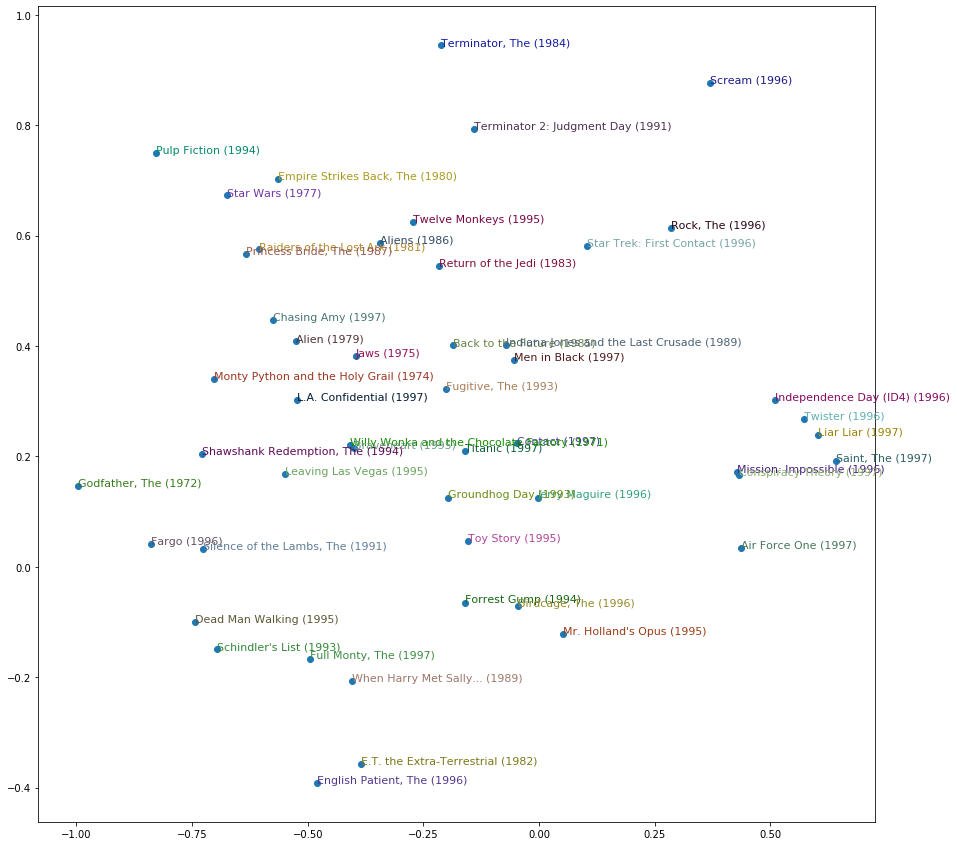

In [60]:
idxs = np.random.choice(len(top_movies), 50, replace=False)
idxs = list(range(50))
X = fac0[idxs]
Y = fac2[idxs]
plt.figure(figsize=(15,15))
plt.scatter(X,Y)
for i,x,y in zip(top_movies[idxs], X, Y):
  plt.text(x,y,i,color=np.random.rand(3)*0.7, fontsize=11)
plt.show()